# <font style = "color:rgb(50,120,229)">Skin Smoothing</font>
Automated face detecting and smoothing pipeline

# Algorithm Outline 

Step 1. Use OpenCV ResNet-10 face detector to detect all faces in the image

Step 2. Crop every detected face

Step 3: Select 4 locations on the face to estimate skin pixel value

Step 4: Convert face to HSV space, estimate skin color range and detect skin region mask (The hue value is within a small range which is easier for skin detection compared to working in BGR color space)

Step 5: Apply Gaussian filter and bilateral on the face crop (in BGR space) to smooth face

Step 6: Apply non-skin region pixel values back to the face

Step 7: Put the skin smoothed face back to the original image

In [2]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# 直接在這裡定義你的資料夾路徑（根據你實際的資料夾位置修改）
DATA_PATH = "C:\\Users\\oooba\\Downloads\\Automated-Face-Detection-and-Smoothing-main\\Automated-Face-Detection-and-Smoothing-main\\data\\"

%matplotlib inline

In [7]:
import matplotlib
matplotlib.rcParams['figure.figsize'] = (6.0,6.0)
matplotlib.rcParams['image.cmap'] = 'gray' 

In [8]:
# Read image
img = cv2.imread('two_faces.jpg')

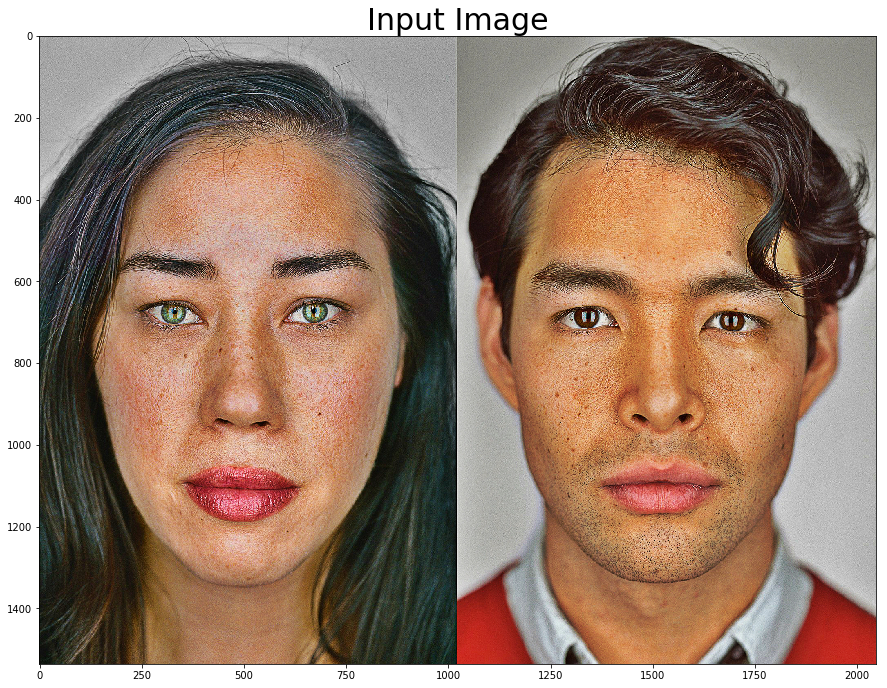

In [9]:
plt.figure(figsize=[15, 15])
plt.imshow(img[:,:,::-1])
plt.title("Input Image", fontsize=30)
plt.show()

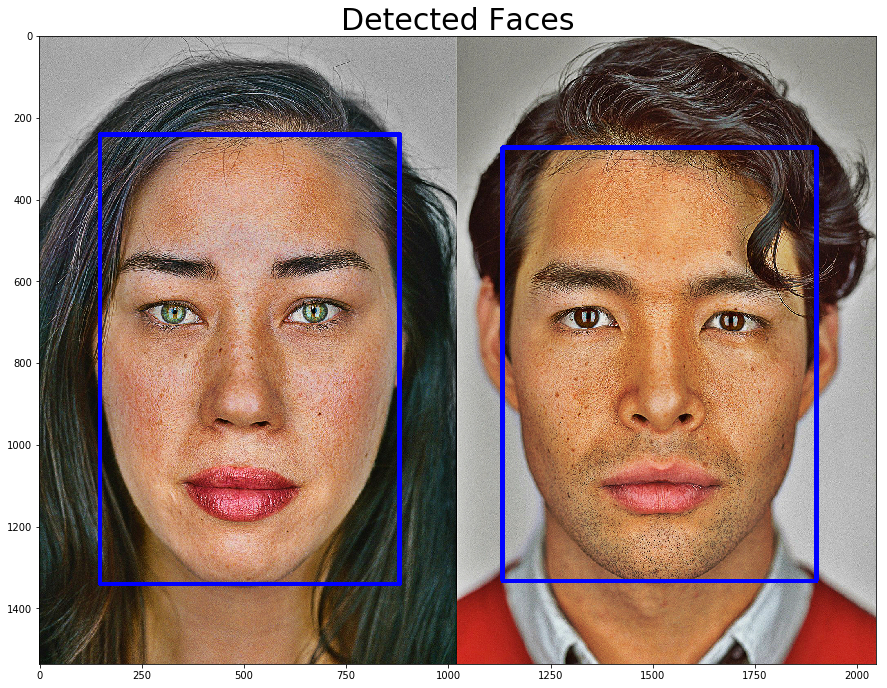

%%%%%%%%%% Face 1 %%%%%%%%%%


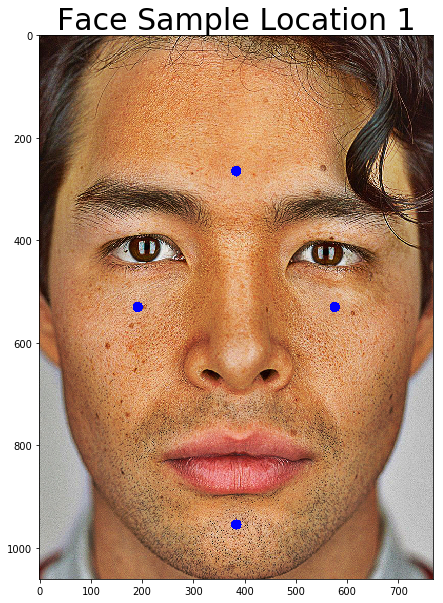

The skin HSV pixel value at Location 1: [ 14. 126. 227.]
The skin HSV pixel value at Location 2: [ 10.  72. 247.]
The skin HSV pixel value at Location 3: [ 14. 137. 209.]
The skin HSV pixel value at Location 4: [ 14.  80. 239.]

The average skin HSV pixel value is: [ 13. 103. 230.]



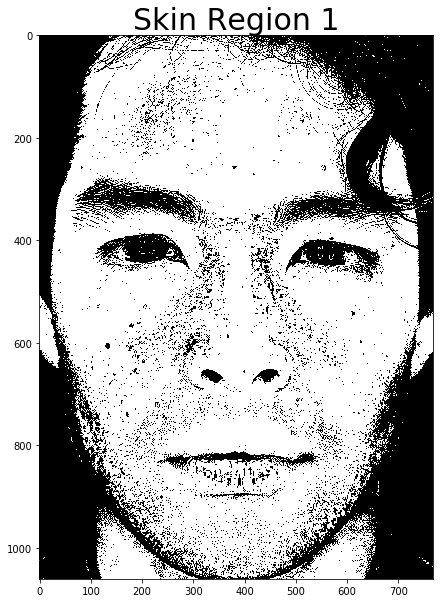

%%%%%%%%%% Face 2 %%%%%%%%%%


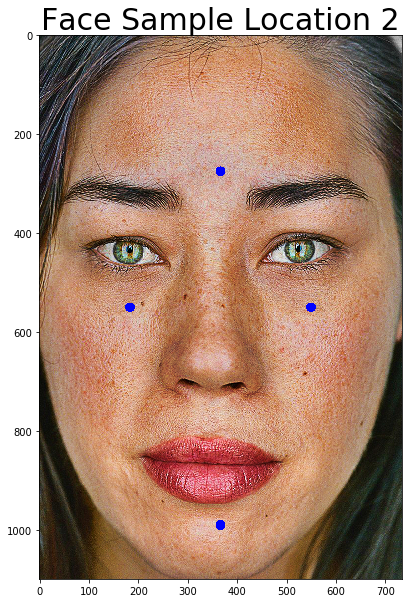

The skin HSV pixel value at Location 1: [  7.  65. 191.]
The skin HSV pixel value at Location 2: [ 11. 103. 207.]
The skin HSV pixel value at Location 3: [  9.  94. 214.]
The skin HSV pixel value at Location 4: [ 11. 103. 198.]

The average skin HSV pixel value is: [  9.  91. 202.]



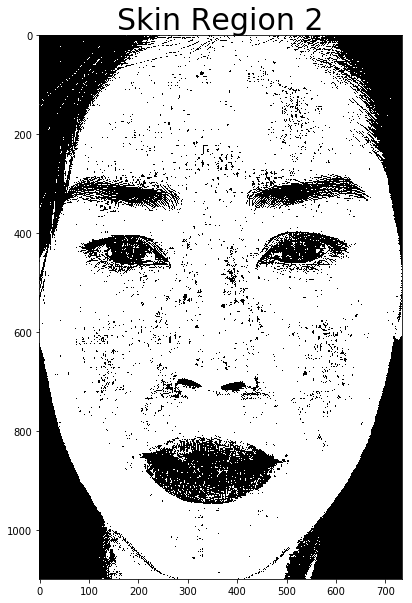

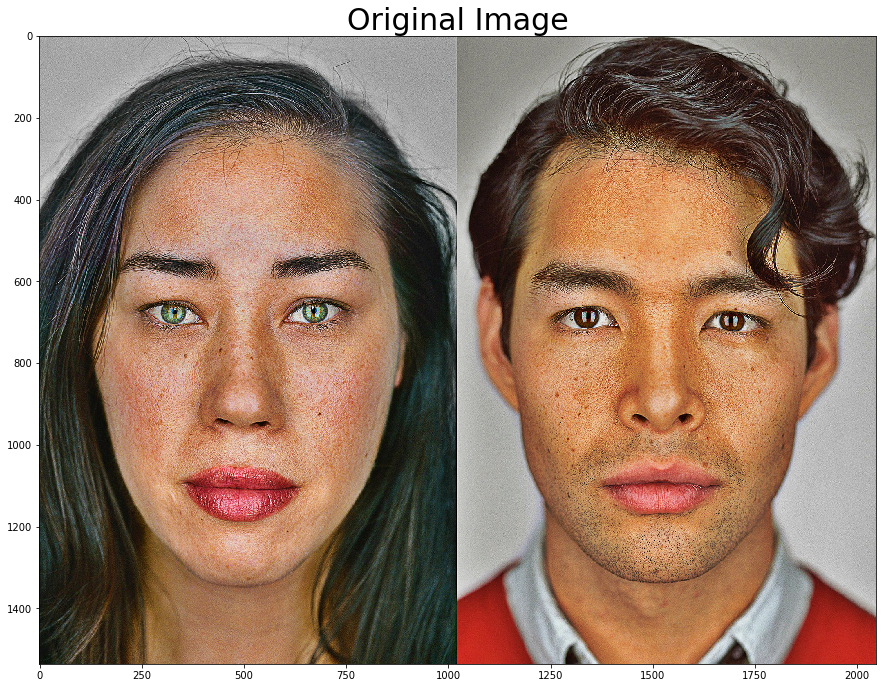

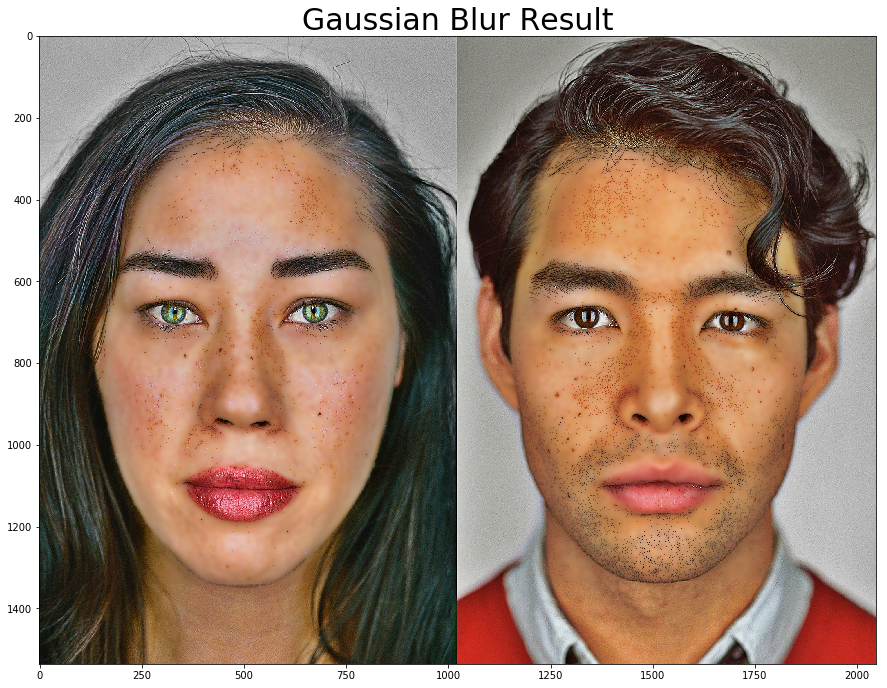

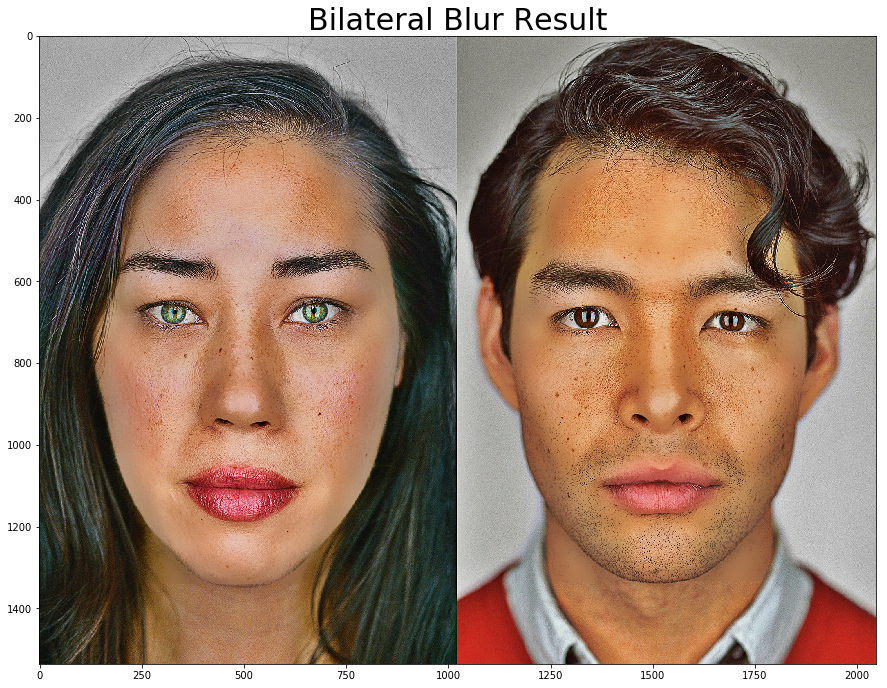

In [10]:
def detectFaceOpenCVDnn(net, frame):
    frameOpencvDnn = frame.copy()
    frameHeight = frameOpencvDnn.shape[0]
    frameWidth = frameOpencvDnn.shape[1]
    blob = cv2.dnn.blobFromImage(frameOpencvDnn, 1.0, (300, 300), [104, 117, 123], False, False)

    net.setInput(blob)
    detections = net.forward()
    bboxes = []
    for i in range(detections.shape[2]):
        confidence = detections[0, 0, i, 2]
        if confidence > conf_threshold:
            x1 = int(detections[0, 0, i, 3] * frameWidth)
            y1 = int(detections[0, 0, i, 4] * frameHeight)
            x2 = int(detections[0, 0, i, 5] * frameWidth)
            y2 = int(detections[0, 0, i, 6] * frameHeight)
            bboxes.append([x1, y1, x2, y2])
            cv2.rectangle(frameOpencvDnn, (x1, y1), (x2, y2), (255, 0, 0), int(round(frameHeight/150)), 8)
    
    return frameOpencvDnn, bboxes

def selectSkinSampleLocs(bbox):
    loc1 = ((bbox[2] - bbox[0]) // 2, (bbox[3] - bbox[1]) // 4)
    loc2 = ((bbox[2] - bbox[0]) // 4, (bbox[3] - bbox[1]) // 2)
    loc3 = ((bbox[2] - bbox[0]) // 4 * 3, (bbox[3] - bbox[1]) // 2)
    loc4 = ((bbox[2] - bbox[0]) // 2, (bbox[3] - bbox[1]) // 10 * 9)

    locs = [loc1, loc2, loc3, loc4]
    return locs

def drawSkinColorSampleLoc(face, bbox, i):
    faceWithSampleLocations = face.copy()
    locs = selectSkinSampleLocs(bbox)
    
    for loc in locs:
        cv2.circle(faceWithSampleLocations, loc, 10, (255, 0, 0), -1) 
   
    plt.figure(figsize=[10,10])
    plt.imshow(faceWithSampleLocations[:,:,::-1])
    plt.title("Face Sample Location " + str(i + 1), fontsize=30)
    plt.show()

def getAvgSkinColorHSV(faceHSV, bbox):                      
    faceHSV = np.float32(faceHSV)  
    locs = selectSkinSampleLocs(bbox)
    avgSkinColorHSV = [0, 0, 0]
    
    locCount = 0
    for loc in locs:
        print('The skin HSV pixel value at Location {}: {}'.format(locCount + 1, faceHSV[loc[1]][loc[0]]))
        avgSkinColorHSV += faceHSV[loc[1]][loc[0]]
        locCount += 1

    avgSkinColorHSV //= len(locs)
    print('\nThe average skin HSV pixel value is: {}\n'.format(avgSkinColorHSV))

    return avgSkinColorHSV


def getSkinRegion(faceHSV, avgSkinColorHSV):
    tolerance = 100
    
    lowerH = max(avgSkinColorHSV[0] - 0.2 * tolerance, 0)
    upperH = min(avgSkinColorHSV[0] + 0.2 * tolerance, 255)
    lowerS = max(avgSkinColorHSV[1] - 0.8 * tolerance, 0)
    upperS = min(avgSkinColorHSV[1] + 0.8 * tolerance, 255)
    lowerV = max(avgSkinColorHSV[2] - 0.8 * tolerance, 0)
    upperV = min(avgSkinColorHSV[2] + 0.8 * tolerance, 255)
    
    skinRegion = cv2.inRange(faceHSV, (lowerH, lowerS, lowerV), (upperH, upperS, upperV))

    return skinRegion





if __name__ == '__main__':
    
    conf_threshold = 0.6

    imgAfterGaussianBlur = img.copy()
    imgAfterBilateralBlur = img.copy()

    # OpenCV ResNet-10 face detector 
    modelFile = DATA_PATH + "/models/opencv_face_detector_uint8.pb"
    configFile = "./opencv_face_detector.pbtxt"
    net = cv2.dnn.readNetFromTensorflow(modelFile, configFile)
    
    # Step 1: face detection
    output, bboxes = detectFaceOpenCVDnn(net, img)
    plt.figure(figsize=[15,15])
    plt.imshow(output[:,:,::-1])
    plt.title("Detected Faces", fontsize=30)
    plt.show()

    faces = []
    for i, bbox in enumerate(bboxes):
        
        # Step 2: face cropping
        face = img[bbox[1]:bbox[3], bbox[0]:bbox[2]]
        faces.append(face)
        
        # Step 3: select 4 locations in the skin region to estimate skin pixel value
        print('%%%%%%%%%% Face {} %%%%%%%%%%'.format(i + 1))
        drawSkinColorSampleLoc(face, bbox, i)

        # Step 4: convert face to HSV space, estimate skin color range and detect skin region mask
        faceHSV = cv2.cvtColor(face, cv2.COLOR_BGR2HSV)
        avgSkinColorHSV = getAvgSkinColorHSV(faceHSV, bbox)
        skinRegion = getSkinRegion(faceHSV, avgSkinColorHSV)

        plt.figure(figsize=[10,10])
        plt.imshow(skinRegion)
        plt.title("Skin Region " + str(i + 1), fontsize=30)
        plt.show()

        # Step 5: apply Gaussian filter and bilateral on the face crop (in BGR space) to smooth face
        
        # For Gaussian Filtering
        kernelSize = 25
        sigmaX = 0
        sigmaY = 0
        faceAfterGaussianBlur = cv2.GaussianBlur(face, (kernelSize, kernelSize), sigmaX, sigmaY)

        # For Bilateral Filtering
        # diameter of the pixel neighbourhood used during filtering
        dia=45;
        # larger the value the distant colours will be mixed together to produce areas of semi equal colors
        sigmaColor=50
        # larger the value more the influence of the farther placed pixels as long as their colors are close enough
        sigmaSpace=80
        faceAfterBilateralBlur = cv2.bilateralFilter(face, dia, sigmaColor, sigmaSpace)

        # Step 6: apply non-skin region pixel values back to the face
        locs = np.where(skinRegion == 0)
        faceAfterGaussianBlur[locs[0], locs[1]] = face[locs[0], locs[1]]
        faceAfterBilateralBlur[locs[0], locs[1]] = face[locs[0], locs[1]]
        
        # Step 7: put the skin smoothed face back to the original image
        imgAfterGaussianBlur[bbox[1]:bbox[3], bbox[0]:bbox[2]] = faceAfterGaussianBlur
        imgAfterBilateralBlur[bbox[1]:bbox[3], bbox[0]:bbox[2]] = faceAfterBilateralBlur

    plt.figure(figsize=[15, 15])
    plt.imshow(img[...,::-1]);plt.title("Original Image", fontsize=30)
    plt.show()

    plt.figure(figsize=[15, 15])
    plt.imshow(imgAfterGaussianBlur[...,::-1]);plt.title("Gaussian Blur Result", fontsize=30)
    plt.show()

    plt.figure(figsize=[15, 15])
    plt.imshow(imgAfterBilateralBlur[...,::-1]);plt.title("Bilateral Blur Result", fontsize=30)
    plt.show()

In [ ]:
# =========================================================================
    # ---- 自動生成文字報告 ----
    # =========================================================================
    for i, bbox in enumerate(bboxes):
        # 為了計算量化數據，重新抓取裁切範圍並計算拉普拉斯方差（代表微紋理與瑕疵強度）
        face = img[bbox[1]:bbox[3], bbox[0]:bbox[2]]
        face_w = bbox[2] - bbox[0]
        face_h = bbox[3] - bbox[1]
        
        # 重新取得處理後的臉部局部
        f_gauss = imgAfterGaussianBlur[bbox[1]:bbox[3], bbox[0]:bbox[2]]
        f_bilat = imgAfterBilateralBlur[bbox[1]:bbox[3], bbox[0]:bbox[2]]
        
        # 計算邊緣/微紋理方差
        var_orig = cv2.Laplacian(face, cv2.CV_64F).var()
        var_gauss = cv2.Laplacian(f_gauss, cv2.CV_64F).var()
        var_bilat = cv2.Laplacian(f_bilat, cv2.CV_64F).var()
        
        # 計算微紋理縮減比例
        reduction_gauss = ((var_orig - var_gauss) / var_orig) * 100 if var_orig > 0 else 0
        reduction_bilat = ((var_orig - var_bilat) / var_orig) * 100 if var_orig > 0 else 0
        
        # 輸出第一部分：Gaussian Blur 報告
        report_gauss = f"""
# ---- 自動生成文字報告 (Face #{i+1} - Gaussian) ----
濾鏡類型：Face Skin Smoothing (臉部磨皮平滑 - 全局模糊版)
方法：ResNet-10 偵測人臉 + HSV 膚色遮罩 + 高斯濾波器 (Kernel: 25)
對臉做了什麼：在 HSV 空間動態採樣膚色範圍並產生遮罩，將遮罩內的皮膚區域進行全方向高斯模糊，再將眼睛、嘴唇等非皮膚區域貼回原圖，達到磨皮效果。
 
量化結果：
- 人臉範圍：({bbox[0]}, {bbox[1]}) 至 ({bbox[2]}, {bbox[3]})，解析度：{face_w}x{face_h}px
- 皮膚微紋理方差：{var_orig:.2f} → {var_gauss:.2f}（微紋理強度縮減 {reduction_gauss:.1f}%）
 
可能的偵測特徵：皮膚區域高頻訊號與噪點異常消失、膚色邊緣與五官交界處可能出現不自然死白或殘留毛邊、毛孔特徵（Texture variance）幾何分佈不連續
"""
        print(report_gauss)

        # 輸出第二部分：Bilateral Blur 報告
        report_bilat = f"""
# ---- 自動生成文字報告 (Face #{i+1} - Bilateral) ----
濾鏡類型：Face Skin Smoothing (臉部磨皮平滑 - 邊緣保留版)
方法：ResNet-10 偵測人臉 + HSV 膚色遮罩 + 雙邊濾波器 (d=45, sColor=50, sSpace=80)
對臉做了什麼：利用雙邊濾波同時考慮空間與色彩相似度的特性，在膚色遮罩區域內抹平細小斑點與毛孔，同時相較於高斯，能保留較大結構的臉部陰影與邊緣。
 
量化結果：
- 人臉範圍：({bbox[0]}, {bbox[1]}) 至 ({bbox[2]}, {bbox[3]})，解析度：{face_w}x{face_h}px
- 皮膚微紋理方差：{var_orig:.2f} → {var_bilat:.2f}（微紋理強度縮減 {reduction_bilat:.1f}%）
 
可能的偵測特徵：高頻微小噪點被選擇性抹除但主要邊緣完好、頻域（Frequency Domain）中高頻能量異常斷層、局部區塊呈現過度平滑的非自然幾何表面
"""
        print(report_bilat)
        
        # 可選：將報告自動寫入檔案中備查
        with open(f"face_{i+1}_smoothing_report.txt", "w", encoding="utf-8") as f_out:
            f_out.write(report_gauss + "\n" + report_bilat)

# CONCLUSION:
We can see that bilateral filtering outperforms Gaussian filtering in skin smoothing since it not only smooths the skin but also does a better job preserving edges (like hair) and therefore largely retains the sharpness of the image.
